In [1]:
from sklearn.datasets import fetch_california_housing
import matplotlib.pyplot as plt
import geopandas as gpd  ## to transform the longitude and latitude data into geographical data for python to make sense of
import folium  ## to generate interactive map
import seaborn as sns
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split ## to split the data into training and testing sets
from sklearn import linear_model ## to build linear regression model
from sklearn.metrics import mean_squared_error, r2_score ## To compute the error and performance of the regression model

Can't load requested DLL: C:\Program Files\GDAL\gdalplugins\ogr_MSSQLSpatial.dll
126: The specified module could not be found.

Can't load requested DLL: C:\Program Files\GDAL\gdalplugins\ogr_MSSQLSpatial.dll
126: The specified module could not be found.

Can't load requested DLL: C:\Program Files\GDAL\gdalplugins\ogr_MSSQLSpatial.dll
126: The specified module could not be found.

Can't load requested DLL: C:\Program Files\GDAL\gdalplugins\ogr_MSSQLSpatial.dll
126: The specified module could not be found.



In [2]:
## Loading the California Housing Data
CA_housing = fetch_california_housing(as_frame=True).frame

In [3]:
CA_housing

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


In [4]:
CA_housing.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


From the brief statistical description displayed above, we can see that the "mean" house in California in that market has at least 5 rooms with at least one of them being a bedroom. The mean values of such house is $200k

In [5]:
## Creating a geographical representation of the housing market
gdf = gpd.GeoDataFrame(
    CA_housing, geometry=gpd.points_from_xy(CA_housing.Longitude, CA_housing.Latitude))

#A GeoJSON file downloaded from "https://github.com/ropensci/geojsonio/blob/master/inst/examples/california.geojson"
CAMap = gpd.read_file('./CAGeo.geojson')

gdf.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,geometry
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,POINT (-122.23000 37.88000)
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,POINT (-122.22000 37.86000)
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,POINT (-122.24000 37.85000)
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,POINT (-122.25000 37.85000)
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,POINT (-122.25000 37.85000)


In [6]:
## setting a CRS for the GeoPandas dataframe (gdf)
## to relate the geometry column to a real world map

gdf = gdf.set_crs(epsg= 4326)

In [7]:
## exploring the housing market on the map
## Interactive representation
f = folium.Figure(width= 1000, height= 600)
gdf.explore(column='MedHouseVal').add_to(f)

The interactive map above shows the distribution of the housing market in California. <br>
It is apparent that the mean value of a house increases the closer it is to the beach.

In [8]:
## the latitude and longitude values were dropped to ensure proper scaling of the correlation plotting.
no_geo = CA_housing.drop(columns=['Latitude', 'Longitude', 'geometry'])

<AxesSubplot:>

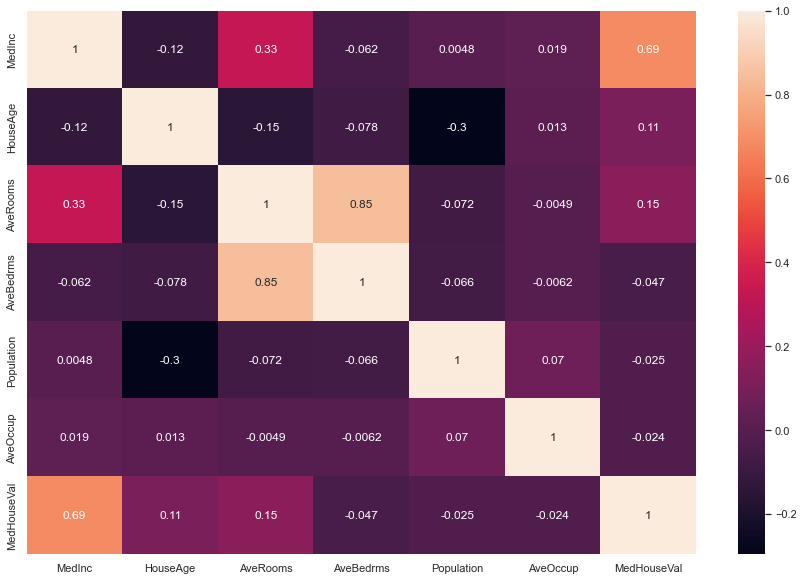

In [9]:
sns.set(rc = {'figure.figsize':(15,10)})
sns.heatmap(no_geo.corr(), annot= True)

The heatmap displayed above shows quite the correlation between the median household income and the median house value  

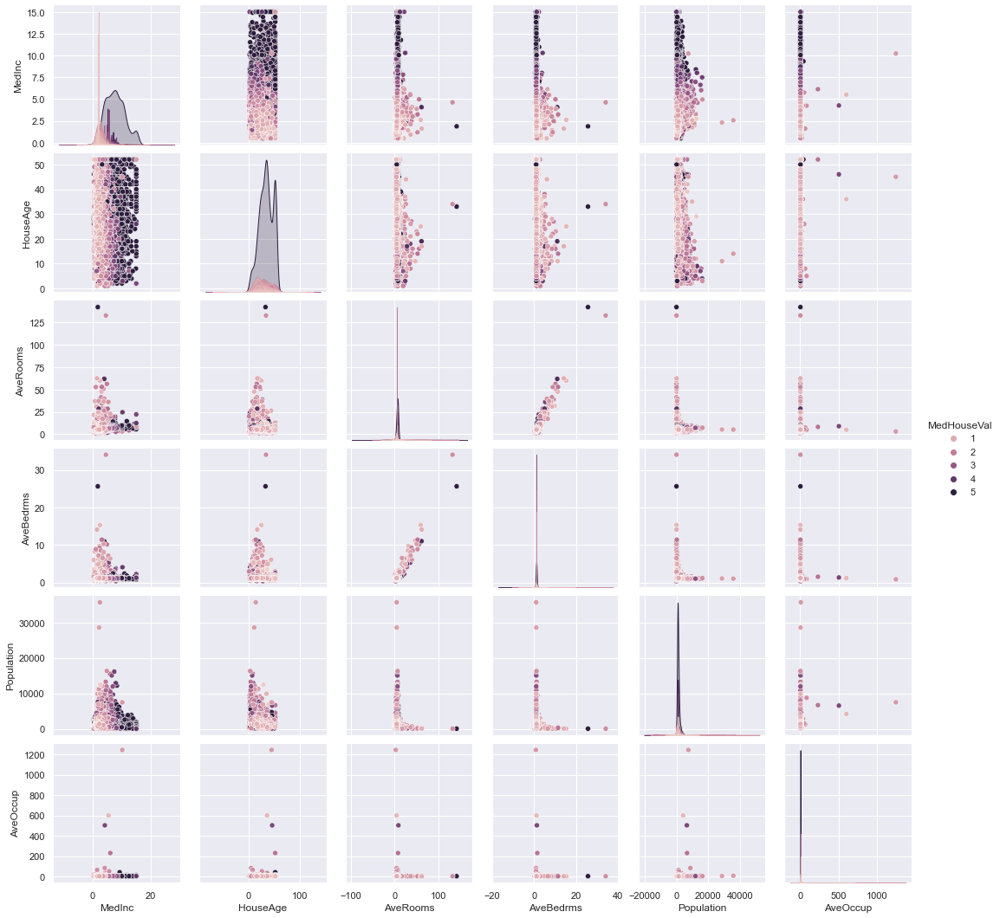

In [10]:
sns.pairplot(no_geo, hue= 'MedHouseVal')

PairPlots above show the relation between the features of the California Housing Dataset. <br>
Light colors signify lower Median House Value, while darker colors represent higher Median House Value. <br>
A histogram of each of the features is displayed along the diagonal of the chart.

In [13]:
CA_housing

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,geometry
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,POINT (-122.23000 37.88000)
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,POINT (-122.22000 37.86000)
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,POINT (-122.24000 37.85000)
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,POINT (-122.25000 37.85000)
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,POINT (-122.25000 37.85000)
...,...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781,POINT (-121.09000 39.48000)
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771,POINT (-121.21000 39.49000)
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923,POINT (-121.22000 39.43000)
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847,POINT (-121.32000 39.43000)


In [11]:
## Creating X and Y matrices from the original dataset
## for the predective model
## X being the variables and Y being the target column

X= CA_housing[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup']]
Y= CA_housing['MedHouseVal']

In [12]:
X.shape, Y.shape

((20640, 6), (20640,))

As shown above, 16,512 rows are used for the training set and 4,128 rows are used for testing

In [13]:
## building the linear model
model = linear_model.LinearRegression()

In [14]:
## fitting the training data
model.fit(X, Y)

LinearRegression()

In [15]:
## predicting some results from the testing rows based on the model fit performed above.
Y_predict = model.predict(X)

In [16]:
X.columns

Index(['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population',
       'AveOccup'],
      dtype='object')

In [17]:
## Model Performance Analysis
print('Coefficients: ', model.coef_)
print('Intercept: ', model.intercept_)
print('Mean Squared Error (MSE): %.2f' % mean_squared_error(Y, Y_predict))
print('Coefficients of Determination (R^2): %.2f' % r2_score(Y, Y_predict))

Coefficients:  [ 5.36910326e-01  1.65033593e-02 -2.11740382e-01  9.93729775e-01
  2.21093787e-05 -4.87715048e-03]
Intercept:  -0.4390934214282911
Mean Squared Error (MSE): 0.61
Coefficients of Determination (R^2): 0.54


The equation for that linear model would be: <br>
Y or MedHouseVal = 5.36910326e-01*(MedInc) + 1.1.65033593e-02*(HouseAge) - 2.11740382e-01*(AveRooms) + 9.93729775e-01*(AveBedrms) + 2.21093787e-05*(Population) - 4.87715048e-02*(AveOccup) - 0.4390934214282911
<br>
<br>
If that doesn't make a lot of sense, just think of it each of the features contribute to the median house value (positively or negatively) by the factors they're multiplied by.

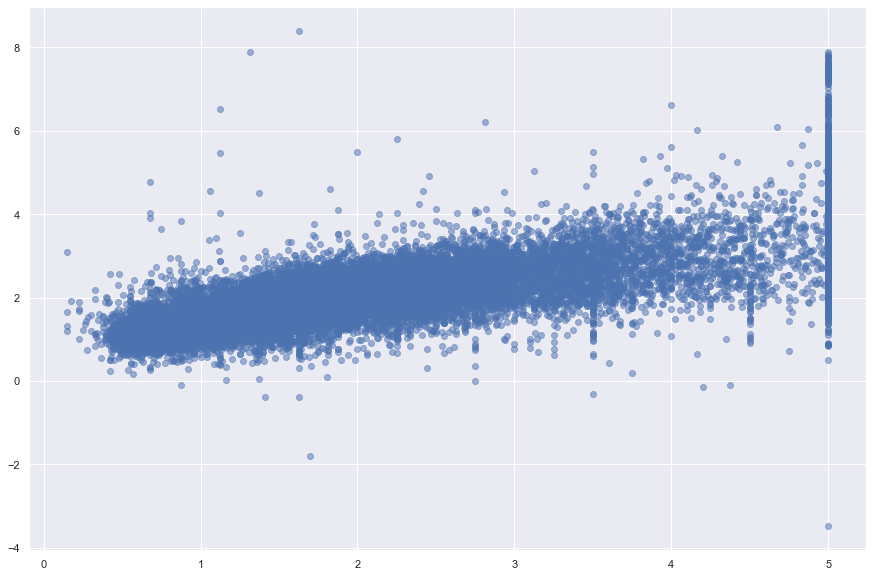

In [18]:
plt.scatter(Y, Y_predict, alpha=0.5)

The scatter plot above shows some outliers from the models where the predicted MedHouseVal<0, which is not good. <br>
Those values below 0 will be droppped.

In [19]:
Y_comb = pd.DataFrame({'Y_test': Y, 'Y_predict': Y_predict})

In [20]:
Y_comb = Y_comb[Y_comb['Y_predict']> 0]

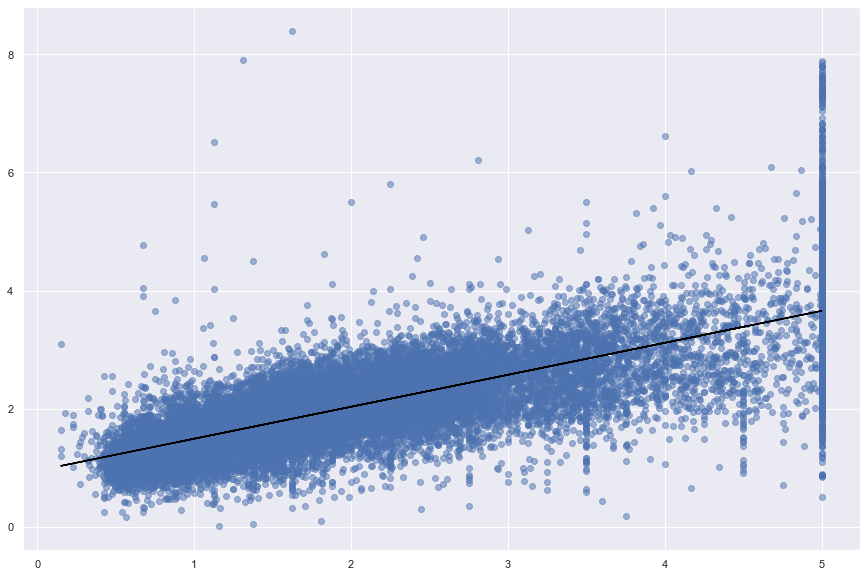

In [23]:
plt.scatter(Y_comb.Y_test, Y_comb.Y_predict, alpha= .5)
## Calculating the intercept and the slope of the best fit line
m, b= np.polyfit(Y_comb.Y_test, Y_comb.Y_predict, 1)
## Adding the regression the line to the plot
plt.plot(Y_comb.Y_test, m*Y_comb.Y_test + b, c= 'black')

plt.show()

With the predicted median house values below 0 dropped, the prediction makes more sense -at least visually.

## Conclusion

Early on in the analysis, we can see that the physical location of the housing block and proximity to the ocean is the largest contributor to the median house value.  <br>
With that said, we can see in the heatmap generated above that the median income is the most positively correlated with the median house value. <br>
Lastly a linear model was fitted, with some outliers in the predicted sample. <br>
In conclusion, the regression model is not the best predictive tool for the dataset.
